# Crop Segmentation with Sentinel2 and CDL Data

## Imports

In [1]:
import matplotlib.pyplot as plt

from torchgeo.datasets import stack_samples, Sentinel2 , CDL
from torchgeo.samplers import RandomGeoSampler, Units, GridGeoSampler
from torchvision.transforms import ToTensor, Normalize, Compose
from torch.utils.data import DataLoader
import torch
from torch import nn


import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"


# My Functions
from torchinfo import summary
from visualize import plot_results, plot_batch, plot_compare, plot_training
from metrics import oa, iou, f1s, loss
from util import weights_reset

## Creating the Datasets

Next, we tell TorchGeo to automatically download the corresponding CDL labels.
Finally, we create an IntersectionDataset so that we can automatically sample from both GeoDatasets simultaneously.

We can prepare it to be loaded into a neural network. For that, we will create an instance of the RasterDataset class, provided by TorchGeo, and point to the specific directory, using the following commands. The `scale` function will apply the `1e-4`  scale necessary to get the Sentinel-2 values in reflectance. Once the datasets are created, we can combine images with masks (labels) using the `&` operator.

In [2]:
#Transformation
def scale(item: dict):
    item['image'] = item['image'] / 10000
    return item

# transform = Compose([scale, Normalize((0.5,), (0.5,)), ToTensor()])
transform=Compose([scale])


# In local address
# sentinel= Sentinel2(root=r"D:\Beihang\Dissertation\Data\Sentinel2_Data\Pratt_2021_USA/S2B_MSIL1C_20210616T171859_N0300_R012_T14SNG_20210616T210250.SAFE"\
#                     ,transforms=transform)
# cdl1=CDL(root=r"D:\Beihang\Dissertation\Data\CDL USA\2021_30m_cdls")


#In Server address
sentinel= Sentinel2(root=r"/home/lb2002214/data/sentinel/S2B_MSIL1C_20210616T171859_N0300_R012_T14SNG_20210616T210250.SAFE/",\
                    transforms=transform)
                
sentinel.bands=[
        "B02",
        "B03",
        "B04",
        "B05",
        "B06",
        "B07",
        "B08",
        "B11",
        "B12",
    ]

nbands=len(sentinel.bands)

print(vars(sentinel))
# cdl1=CDL(root=r"/home/lb2002214/data/2021_30m_cdls/Agg200_c2021_30m_cdls_All/")
# cdl1=CDL(root=r"/home/lb2002214/data/2021_30m_cdls/c2021_30m_cdls_corn+65_NAD/")
# cdl1=CDL(root=r"/home/lb2002214/data/2021_30m_cdls/c2021_30m_cdls_corn+75_NAD/")
# cdl1=CDL(root=r"/home/lb2002214/data/2021_30m_cdls/c2021_30m_cdls_cornAllClip_Albert/")
cdl1=CDL(root=r"/home/lb2002214/data/2021_30m_cdls/Plus75perShrink_Corn/")

# cdl1=CDL(root=r"data/2021_30m_cdls")
# print(vars(cdl1))

dataset = sentinel & cdl1
print(vars(dataset))


splitrat=0.7
random_seed = 42
epoches=90
devices="cuda:1"
batch_size=4
Size=256
length=2500
nclasses= 2

{'filename_glob': 'T*_*_B01*.*', 'filename_regex': '\n        ^T(?P<tile>\\d{2}[A-Z]{3})\n        _(?P<date>\\d{8}T\\d{6})\n        _(?P<band>B[018][\\dA])\n        (?:_(?P<resolution>10m))?\n        \\..*$\n    ', 'transforms': Compose(
    <function scale at 0x7f5fcfb73740>
), 'index': rtree.index.Index(bounds=[499980.0, 609780.0, 4090200.0, 4200000.0, 1623835139.0, 1623835139.999999], size=1), 'root': '/home/lb2002214/data/sentinel/S2B_MSIL1C_20210616T171859_N0300_R012_T14SNG_20210616T210250.SAFE/', 'bands': ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B11', 'B12'], 'cache': True, '_crs': CRS.from_epsg(32614), 'res': 10}
Converting CDL CRS from EPSG:5070 to EPSG:32614
Converting CDL resolution from 30.0 to 10
{'transforms': None, 'index': rtree.index.Index(bounds=[499980.0, 609780.0, 4090200.0, 4200000.0, 1623835139.0, 1623835139.999999], size=1), 'datasets': [<torchgeo.datasets.sentinel.Sentinel2 object at 0x7f5ff0bd9550>, <torchgeo.datasets.cdl.CDL object at 0x7f5fe13a3d10>]

## Creating Dataloaders

Creating a `DataLoader` in TorchGeo is very straightforward, just like it is with Pytorch (we are actually using the same class). Note below that we are also using the same samplers already defined. Additionally we inform the dataset that the dataloader will use to pull data from, the batch_size (number of samples in each batch) and a collate function that specifies how to “concatenate” the multiple samples into one single batch.

Finally, we can iterate through the dataloader to grab batches from it. To test it, we will get the first batch.

train_samples= 1750, valid_samples=750
BoundingBox(minx=533812.2471213341, maxx=536372.2471213341, miny=4093292.265250683, maxy=4095852.265250683, mint=1623835139.0, maxt=1623835139.999999)
dict_keys(['crs', 'bbox', 'image', 'mask'])
torch.Size([9, 256, 256]) torch.float32 tensor(0.0174) tensor(0.5310)
torch.Size([1, 256, 256]) torch.int64 tensor(0) tensor(0)
0


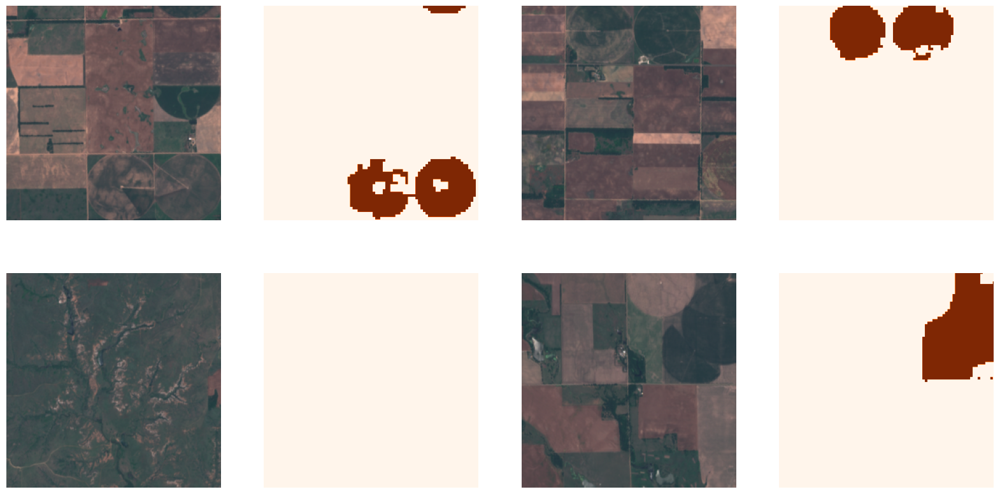

In [3]:
# sampler=GridGeoSampler(dataset_sampler,stride=size=Size,size=size=Size)

samples=RandomGeoSampler(dataset,size=Size,length=length)
train_sampler=list(samples)[round(samples.__len__()*(1-splitrat)):]
valid_sampler=list(samples)[:round(samples.__len__()*(1-splitrat))]
print(f"train_samples= {train_sampler.__len__()}, valid_samples={valid_sampler.__len__()}")


train_dataloader = DataLoader(dataset, sampler=train_sampler, batch_size=4, collate_fn=stack_samples)
valid_dataloader = DataLoader(dataset, sampler=valid_sampler, batch_size=4, collate_fn=stack_samples)

bbox = next(iter(train_sampler))
print(bbox)
sample = dataset[bbox]
print(sample.keys())
## Load a sample and batch of images and labels
print(sample["image"].shape, sample["image"].dtype, sample["image"].min(), sample["image"].max())
print(sample["mask"].shape, sample["mask"].dtype, sample["mask"].min(), sample["mask"].max())



# train_batch = next(iter(train_dataloader))
# train_batch.keys()
# plot_batch(train_batch,chnls=[2,1,0])

###Choosing Visual Valid Samples
### Choosing with While
# kk=True
# i=0
# while kk:
#     valid_batch = next(iter(valid_dataloader))
#     if len(torch.where(torch.sum(valid_batch["mask"], dim=(2,3))>10000)[0]) >= 1 : kk=False
#     i +=1      
# print(i)

# valid_batch = next(iter(valid_dataloader))

# ### Choosing with For
for ii in range(valid_dataloader.__len__()):
    print(ii)
    valid_batch=list(valid_dataloader)[ii]
    if len(torch.where(torch.sum(valid_batch["mask"], dim=(2,3))>4000)[0]) >= 3 :
        break

plot_batch(valid_batch,chnls=[2,1,0])


### Understanding the sampler
To create training patches that can be fed into a neural network from our dataset, we need to select samples of fixed sizes. TorchGeo has many samplers, but here we will use the `RandomGeoSampler` class. Basically, the sampler selects random bounding boxes of fixed size that belongs to the original image. Then, these bounding boxes are used in the `RasterDataset` to query the portion of the image we want. Here is an example using the previously created samplers.

## Batch Visualization

The function `plot_batch` will check automatically the number of items in the batch and if there are masks associated to arrange the output grid accordingly.

In [ ]:
train_batch = next(iter(train_dataloader))
plot_batch(train_batch,chnls=[2,1,0])

## Segmentation Models

In [4]:
from segmentation_models_pytorch import DeepLabV3, DeepLabV3Plus, Unet, UnetPlusPlus, MAnet, Linknet, FPN, PSPNet, PAN

#DeepLabV3_resnet50
DLV3R50 = DeepLabV3(classes= nclasses,in_channels=nbands,encoder_name="resnet50",encoder_depth=5,encoder_weights=None)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = DLV3R50(x)
print(f"Out: {out.shape}")
summary(DLV3R50)

#DeepLabV3Plus_resnet50
DLV3PR50 = DeepLabV3Plus(classes= nclasses,in_channels=nbands,encoder_name="resnet50",encoder_depth=5,encoder_weights=None)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = DLV3PR50(x)
print(f"Out: {out.shape}")
summary(DLV3PR50)

#Unet_resnet50
UnetR50 = Unet(classes= nclasses,in_channels=nbands,decoder_channels=(256, 128, 64, 32, 16),encoder_name="resnet50",encoder_depth=5,encoder_weights=None,decoder_use_batchnorm=True,)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = UnetR50(x)
print(f"Out: {out.shape}")
summary(UnetR50)

#Unet++_resnet34
UnetPPR50 = UnetPlusPlus(classes= nclasses,in_channels=nbands,decoder_channels=(256, 128, 64, 32, 16),encoder_name="resnet50",encoder_depth=5,encoder_weights=None,decoder_use_batchnorm=True,)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = UnetPPR50(x)
print(f"Out: {out.shape}")
summary(UnetPPR50)

#MAnet_resnet50
MAnetR50 = MAnet(classes= nclasses,in_channels=nbands,decoder_channels=(256, 128, 64, 32, 16),encoder_name="resnet50",encoder_depth=5,encoder_weights=None,decoder_use_batchnorm=True,)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = MAnetR50(x)
print(f"Out: {out.shape}")
summary(MAnetR50)

#Linknet_resnet50
LinknetR50 = Linknet(classes= nclasses,in_channels=nbands,encoder_name="resnet50",encoder_depth=5,encoder_weights=None,decoder_use_batchnorm=True,)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = LinknetR50(x)
print(f"Out: {out.shape}")
summary(LinknetR50)

#Linknet_resnet50
FPNR50 = FPN(classes= nclasses,in_channels=nbands,encoder_name="resnet50",encoder_depth=5,encoder_weights=None)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = FPNR50(x)
print(f"Out: {out.shape}")
summary(FPNR50)

#PSPNet_resnet50
PSPNetR50 = PSPNet(classes= nclasses,in_channels=nbands,encoder_name="resnet50",encoder_depth=5,encoder_weights=None,upsampling=32,)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = PSPNetR50(x)
print(f"Out: {out.shape}")
summary(PSPNetR50)

#PAN_resnet50
PANR50 = PAN(classes= nclasses,in_channels=nbands,encoder_name="resnet50",encoder_weights=None)
x = torch.randn(size=(batch_size,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = PANR50(x)
print(f"Out: {out.shape}")
summary(PANR50)

Out: torch.Size([4, 2, 256, 256])
Out: torch.Size([4, 2, 256, 256])
Out: torch.Size([4, 2, 256, 256])
Out: torch.Size([4, 2, 256, 256])
Out: torch.Size([4, 2, 256, 256])
Out: torch.Size([4, 2, 256, 256])
Out: torch.Size([4, 2, 256, 256])
Out: torch.Size([4, 2, 256, 256])
Out: torch.Size([4, 2, 256, 256])


Layer (type:depth-idx)                        Param #
PAN                                           --
├─ResNetEncoder: 1-1                          --
│    └─Conv2d: 2-1                            28,224
│    └─BatchNorm2d: 2-2                       128
│    └─ReLU: 2-3                              --
│    └─MaxPool2d: 2-4                         --
│    └─Sequential: 2-5                        --
│    │    └─Bottleneck: 3-1                   75,008
│    │    └─Bottleneck: 3-2                   70,400
│    │    └─Bottleneck: 3-3                   70,400
│    └─Sequential: 2-6                        --
│    │    └─Bottleneck: 3-4                   379,392
│    │    └─Bottleneck: 3-5                   280,064
│    │    └─Bottleneck: 3-6                   280,064
│    │    └─Bottleneck: 3-7                   280,064
│    └─Sequential: 2-7                        --
│    │    └─Bottleneck: 3-8                   1,512,448
│    │    └─Bottleneck: 3-9                   1,117,184
│    │    └─B

## File Unet

In [5]:
from unet import (
    ActivationFunction,
    ConvMode,
    Dimensions,
    NormalizationLayer,
    UNet,
    UpMode,
)

batch_size = batch_size
in_channels = nbands
out_channels = 2
height =width= Size
n_blocks= 5
unet = UNet(
    in_channels=nbands,
    out_channels=out_channels,
    n_blocks=n_blocks,
    start_filters=16,
    activation=ActivationFunction.RELU,
    normalization=NormalizationLayer.BATCH,
    conv_mode=ConvMode.SAME,
    dim=Dimensions.TWO,
    up_mode=UpMode.TRANSPOSED,
)

x = torch.randn(size=(1,9,256,256), dtype=torch.float32)
with torch.no_grad():
    out = unet(x)

print(f"Out: {out.shape}")

# assert out.shape == (batch_size, out_channels, height, width)
summary(unet)

# def weights_init(m):
#     if isinstance(m, nn.Conv2d):
#         torch.nn.init.xavier_uniform_(m.weight.data)


Out: torch.Size([1, 2, 256, 256])


Layer (type:depth-idx)                   Param #
UNet                                     --
├─Conv2d: 1-1                            34
├─ModuleList: 1-2                        --
│    └─DownBlock: 2-1                    --
│    │    └─Conv2d: 3-1                  1,312
│    │    └─Conv2d: 3-2                  2,320
│    │    └─MaxPool2d: 3-3               --
│    │    └─ReLU: 3-4                    --
│    │    └─ReLU: 3-5                    --
│    │    └─BatchNorm2d: 3-6             32
│    │    └─BatchNorm2d: 3-7             32
│    └─DownBlock: 2-2                    --
│    │    └─Conv2d: 3-8                  4,640
│    │    └─Conv2d: 3-9                  9,248
│    │    └─MaxPool2d: 3-10              --
│    │    └─ReLU: 3-11                   --
│    │    └─ReLU: 3-12                   --
│    │    └─BatchNorm2d: 3-13            64
│    │    └─BatchNorm2d: 3-14            64
│    └─DownBlock: 2-3                    --
│    │    └─Conv2d: 3-15                 18,496
│    │    └

## Training

Parameters according to this article:
https://www.sciencedirect.com/science/article/pii/S0034425721003230 

In [6]:
#Model
model = DLV3R50.apply(weights_reset)

#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)




Epoch 0: Train Loss=0.09456, validation Loss=0.08233 - Accs=[0.98, 0.207, 0.207]
Epoch 1: Train Loss=0.05691, validation Loss=0.05530 - Accs=[0.98, 0.207, 0.207]
Epoch 2: Train Loss=0.04465, validation Loss=0.03215 - Accs=[0.987, 0.486, 0.591]
Epoch 3: Train Loss=0.03782, validation Loss=0.02983 - Accs=[0.988, 0.52, 0.622]
Epoch 4: Train Loss=0.03130, validation Loss=0.03183 - Accs=[0.985, 0.425, 0.517]
Epoch 5: Train Loss=0.03020, validation Loss=0.02743 - Accs=[0.989, 0.542, 0.641]
Epoch 6: Train Loss=0.02829, validation Loss=0.02741 - Accs=[0.988, 0.516, 0.61]
Epoch 7: Train Loss=0.02800, validation Loss=0.02767 - Accs=[0.988, 0.477, 0.558]
Epoch 8: Train Loss=0.02675, validation Loss=0.02809 - Accs=[0.988, 0.456, 0.533]
Epoch 9: Train Loss=0.02616, validation Loss=0.02795 - Accs=[0.988, 0.46, 0.539]
Epoch 10: Train Loss=0.02562, validation Loss=0.02693 - Accs=[0.989, 0.49, 0.571]
Epoch 11: Train Loss=0.02578, validation Loss=0.02618 - Accs=[0.989, 0.537, 0.629]
Epoch 12: Train Loss

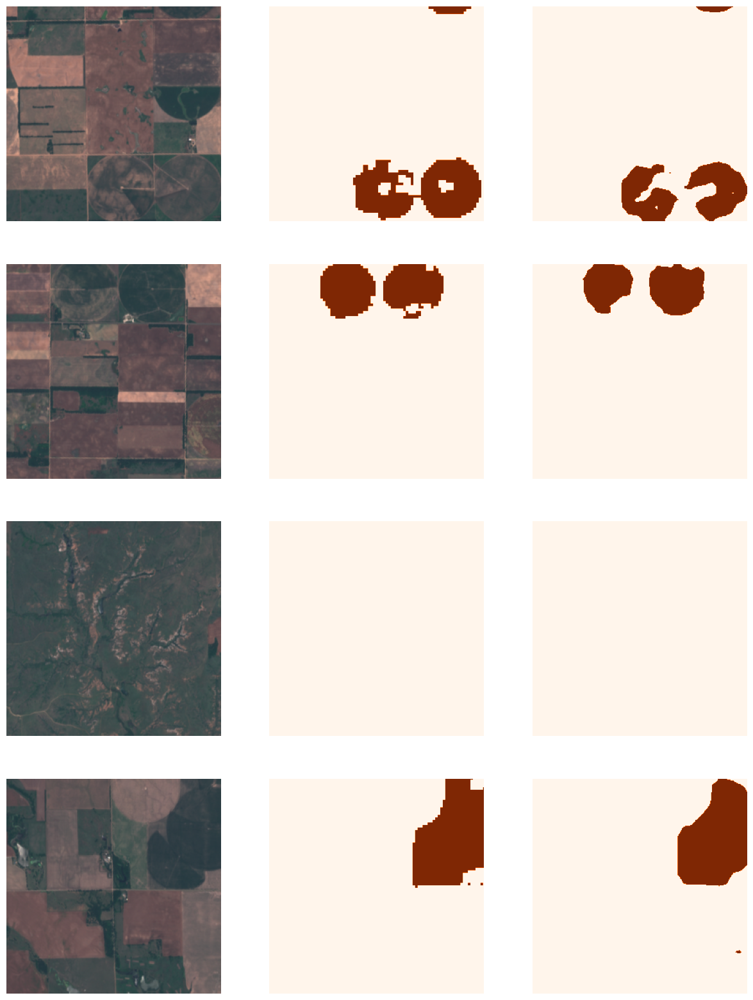

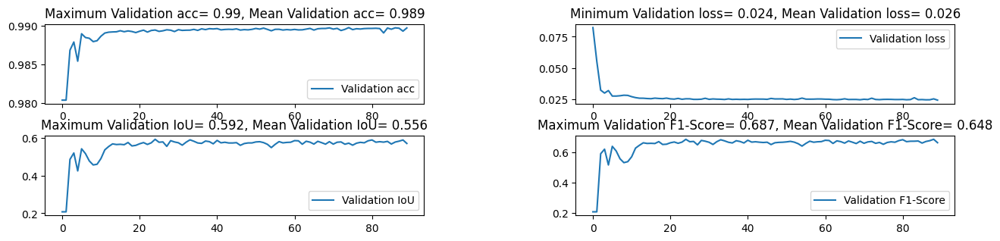

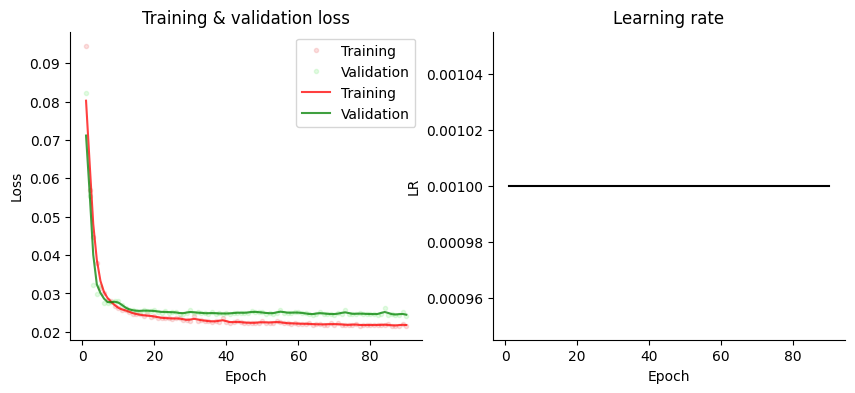

In [7]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [8]:

#Model
model = DLV3PR50.apply(weights_reset)

#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)


Epoch 0: Train Loss=0.05256, validation Loss=0.03413 - Accs=[0.986, 0.318, 0.42]
Epoch 1: Train Loss=0.03259, validation Loss=0.02683 - Accs=[0.989, 0.481, 0.581]
Epoch 2: Train Loss=0.02702, validation Loss=0.02547 - Accs=[0.989, 0.548, 0.646]
Epoch 3: Train Loss=0.02593, validation Loss=0.02480 - Accs=[0.99, 0.562, 0.659]
Epoch 4: Train Loss=0.02473, validation Loss=0.02569 - Accs=[0.989, 0.56, 0.657]
Epoch 5: Train Loss=0.02353, validation Loss=0.02486 - Accs=[0.99, 0.561, 0.655]
Epoch 6: Train Loss=0.02365, validation Loss=0.02390 - Accs=[0.99, 0.594, 0.686]
Epoch 7: Train Loss=0.02336, validation Loss=0.02364 - Accs=[0.99, 0.59, 0.681]
Epoch 8: Train Loss=0.02279, validation Loss=0.02376 - Accs=[0.99, 0.58, 0.675]
Epoch 9: Train Loss=0.02296, validation Loss=0.02375 - Accs=[0.99, 0.586, 0.679]
Epoch 10: Train Loss=0.02283, validation Loss=0.02375 - Accs=[0.99, 0.591, 0.686]
Epoch 11: Train Loss=0.02259, validation Loss=0.02366 - Accs=[0.99, 0.578, 0.67]
Epoch 12: Train Loss=0.0226

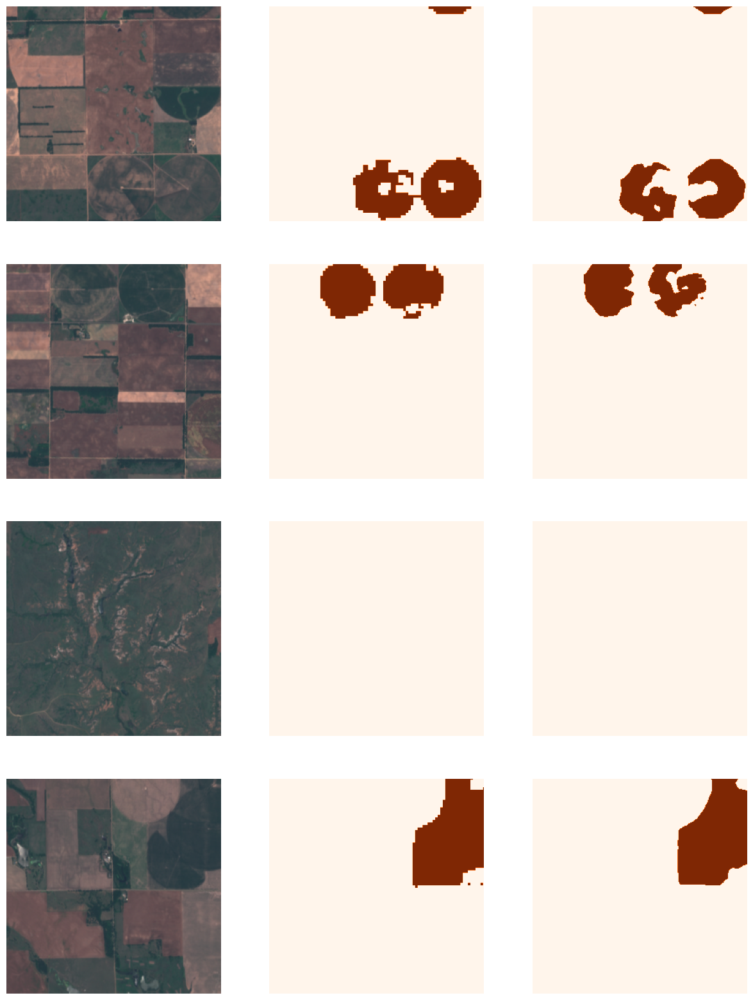

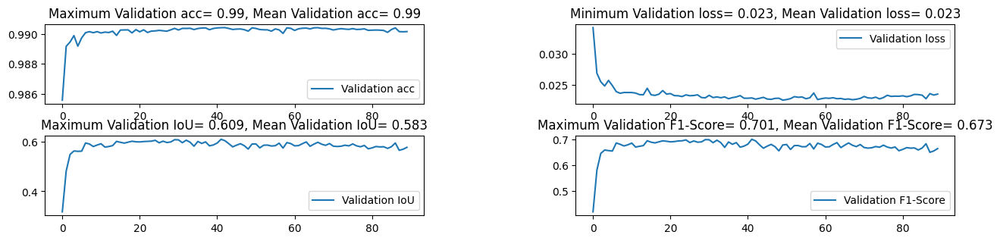

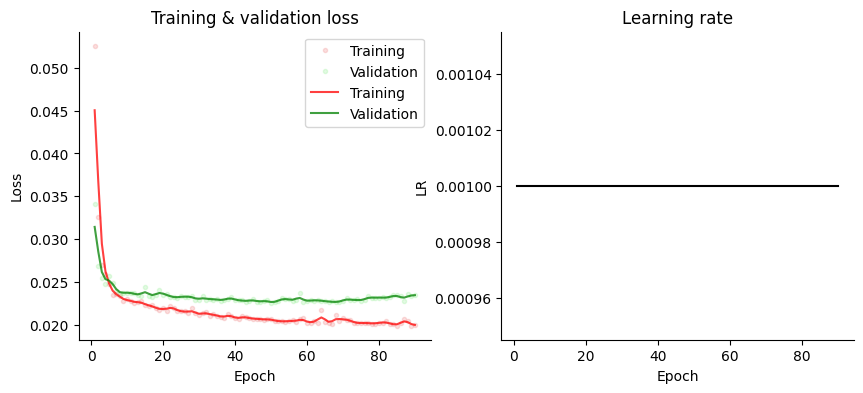

In [9]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [10]:

#Model
model = UnetR50.apply(weights_reset)

#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)



Epoch 0: Train Loss=0.06079, validation Loss=0.04749 - Accs=[0.981, 0.234, 0.259]
Epoch 1: Train Loss=0.03489, validation Loss=0.02688 - Accs=[0.989, 0.476, 0.578]
Epoch 2: Train Loss=0.02769, validation Loss=0.02621 - Accs=[0.989, 0.549, 0.652]
Epoch 3: Train Loss=0.02751, validation Loss=0.02583 - Accs=[0.989, 0.559, 0.662]
Epoch 4: Train Loss=0.02584, validation Loss=0.02533 - Accs=[0.989, 0.542, 0.643]
Epoch 5: Train Loss=0.02542, validation Loss=0.02509 - Accs=[0.989, 0.567, 0.667]
Epoch 6: Train Loss=0.02454, validation Loss=0.02479 - Accs=[0.99, 0.574, 0.672]
Epoch 7: Train Loss=0.02451, validation Loss=0.02450 - Accs=[0.99, 0.569, 0.667]
Epoch 8: Train Loss=0.02402, validation Loss=0.02489 - Accs=[0.989, 0.53, 0.628]
Epoch 9: Train Loss=0.02385, validation Loss=0.02521 - Accs=[0.989, 0.51, 0.607]
Epoch 10: Train Loss=0.02377, validation Loss=0.02563 - Accs=[0.989, 0.52, 0.617]
Epoch 11: Train Loss=0.02377, validation Loss=0.02547 - Accs=[0.989, 0.541, 0.639]
Epoch 12: Train Los

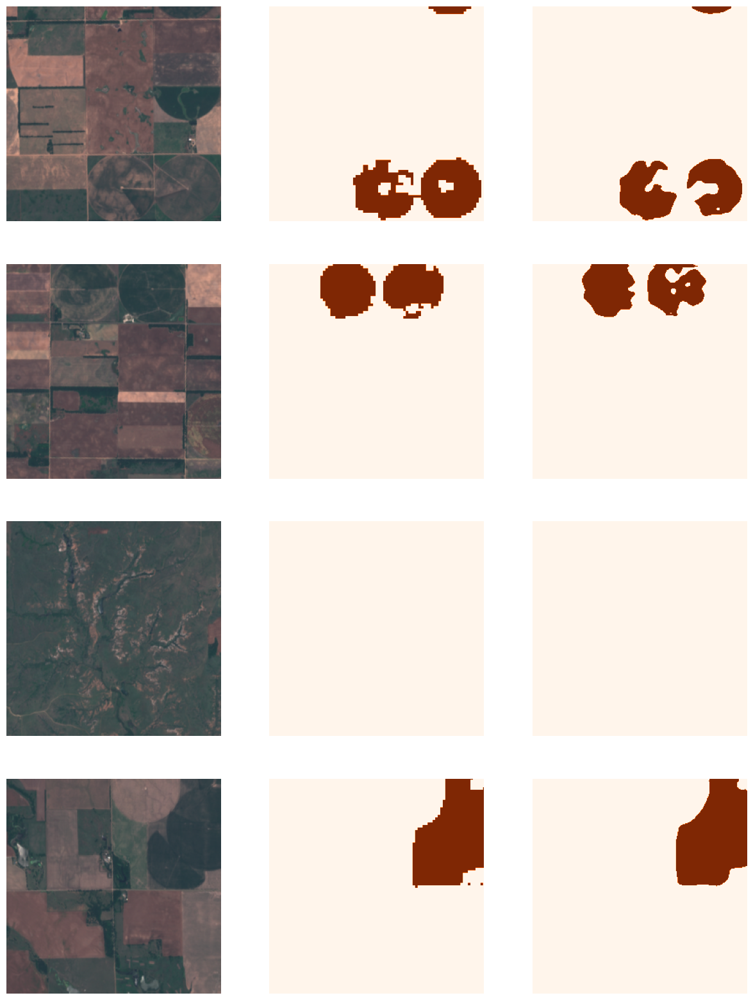

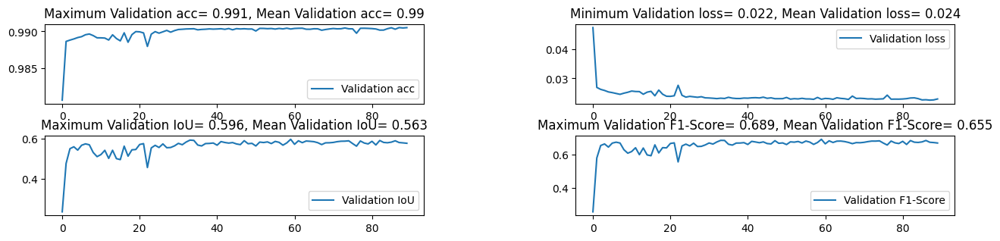

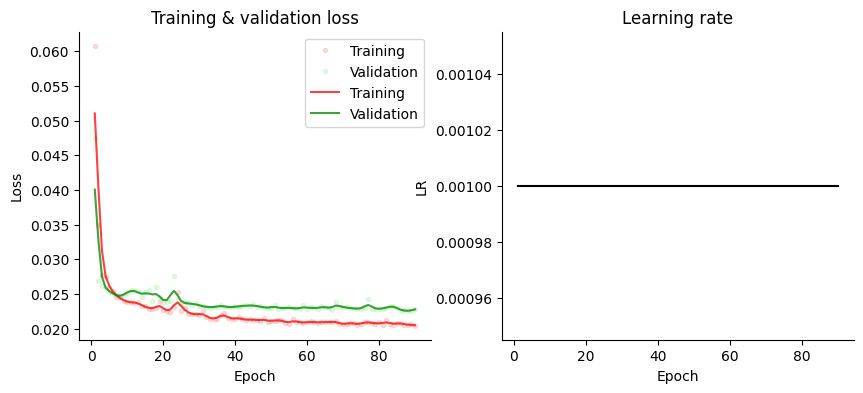

In [11]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [12]:
#model
model = UnetPPR50.apply(weights_reset)

#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)


Epoch 0: Train Loss=0.06066, validation Loss=0.04431 - Accs=[0.98, 0.207, 0.207]
Epoch 1: Train Loss=0.03824, validation Loss=0.03492 - Accs=[0.98, 0.207, 0.207]
Epoch 2: Train Loss=0.03352, validation Loss=0.03118 - Accs=[0.98, 0.207, 0.207]
Epoch 3: Train Loss=0.03112, validation Loss=0.02987 - Accs=[0.98, 0.207, 0.207]
Epoch 4: Train Loss=0.02909, validation Loss=0.02786 - Accs=[0.988, 0.511, 0.605]
Epoch 5: Train Loss=0.02967, validation Loss=0.02726 - Accs=[0.989, 0.534, 0.633]
Epoch 6: Train Loss=0.02576, validation Loss=0.02653 - Accs=[0.989, 0.554, 0.65]
Epoch 7: Train Loss=0.02863, validation Loss=0.02609 - Accs=[0.989, 0.551, 0.649]
Epoch 8: Train Loss=0.02520, validation Loss=0.02532 - Accs=[0.99, 0.574, 0.669]
Epoch 9: Train Loss=0.02529, validation Loss=0.02543 - Accs=[0.99, 0.56, 0.657]
Epoch 10: Train Loss=0.02504, validation Loss=0.02493 - Accs=[0.99, 0.571, 0.665]
Epoch 11: Train Loss=0.02409, validation Loss=0.02530 - Accs=[0.989, 0.573, 0.668]
Epoch 12: Train Loss=0.

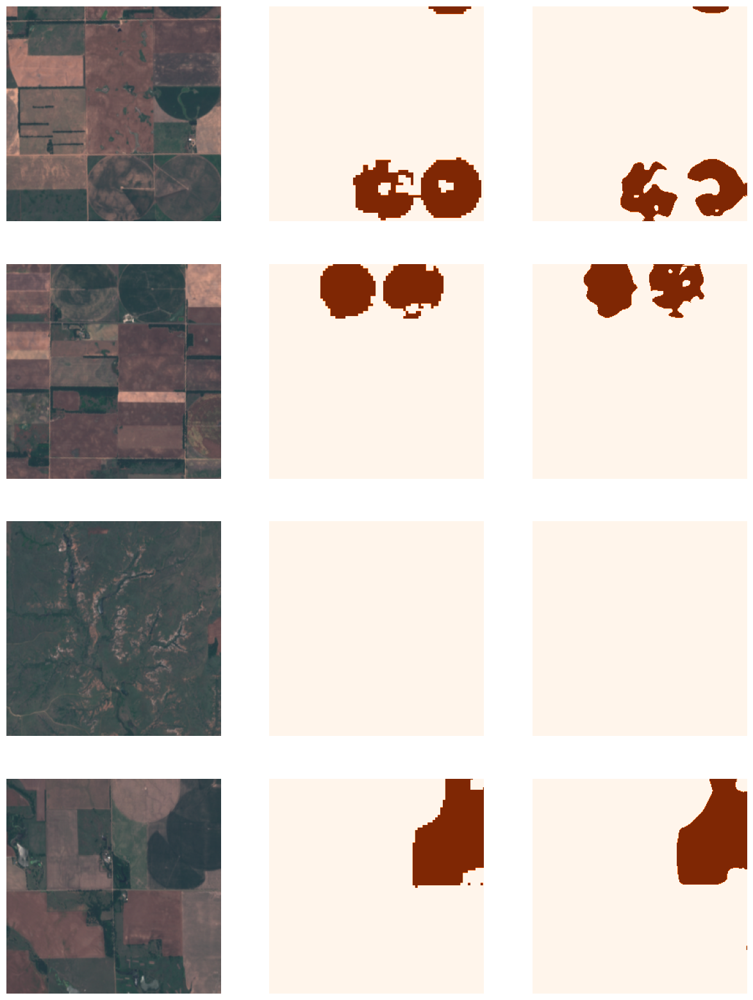

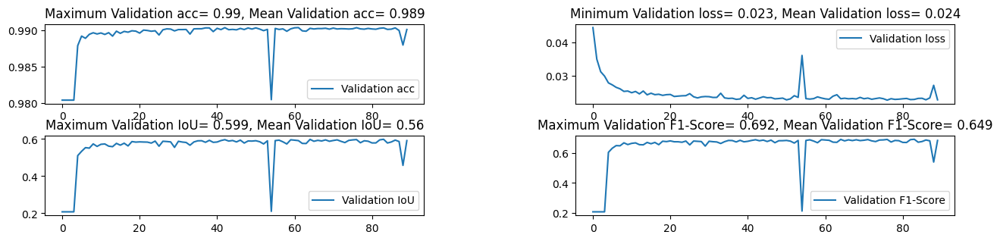

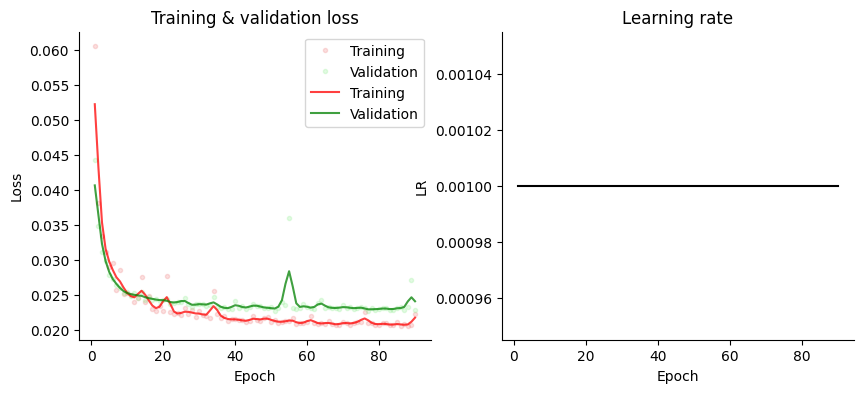

In [13]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [14]:
#Model
model = MAnetR50.apply(weights_reset)
#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)

Epoch 0: Train Loss=0.06889, validation Loss=0.03655 - Accs=[0.98, 0.207, 0.207]
Epoch 1: Train Loss=0.03516, validation Loss=0.03078 - Accs=[0.98, 0.207, 0.207]
Epoch 2: Train Loss=0.03184, validation Loss=0.03031 - Accs=[0.98, 0.207, 0.207]
Epoch 3: Train Loss=0.02832, validation Loss=0.02851 - Accs=[0.98, 0.207, 0.207]
Epoch 4: Train Loss=0.02836, validation Loss=0.02801 - Accs=[0.989, 0.543, 0.646]
Epoch 5: Train Loss=0.02727, validation Loss=0.02928 - Accs=[0.988, 0.485, 0.578]
Epoch 6: Train Loss=0.02815, validation Loss=0.02715 - Accs=[0.988, 0.523, 0.619]
Epoch 7: Train Loss=0.02726, validation Loss=0.02656 - Accs=[0.989, 0.562, 0.661]
Epoch 8: Train Loss=0.02661, validation Loss=0.02551 - Accs=[0.989, 0.558, 0.657]
Epoch 9: Train Loss=0.02498, validation Loss=0.02507 - Accs=[0.99, 0.57, 0.667]
Epoch 10: Train Loss=0.02458, validation Loss=0.02507 - Accs=[0.99, 0.565, 0.661]
Epoch 11: Train Loss=0.02431, validation Loss=0.02500 - Accs=[0.99, 0.546, 0.641]
Epoch 12: Train Loss=0

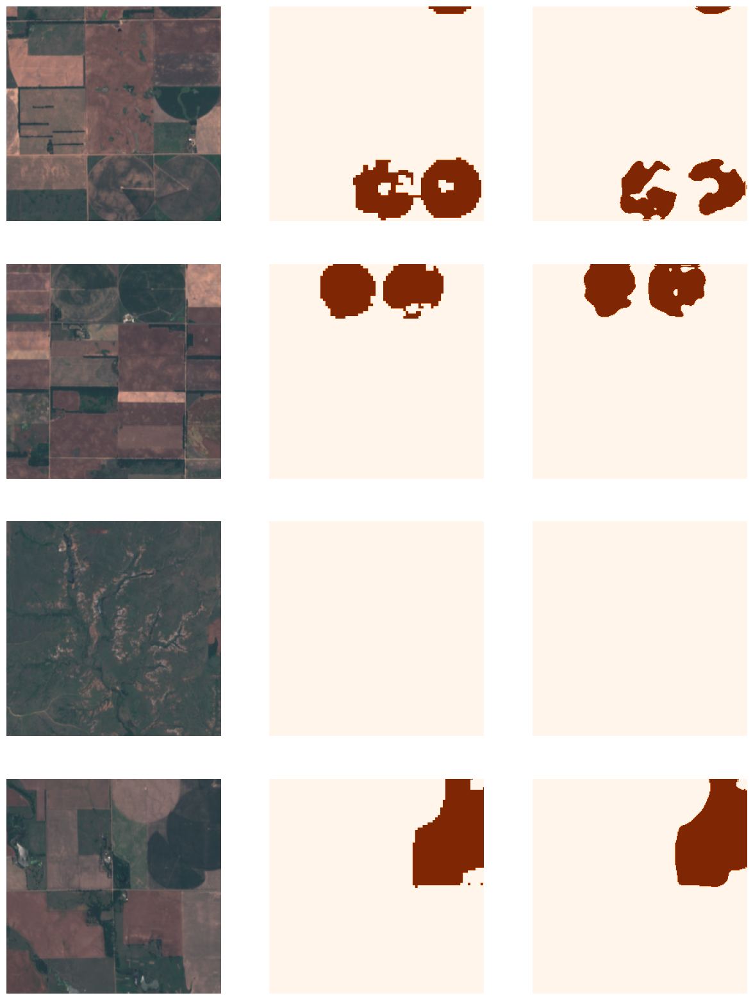

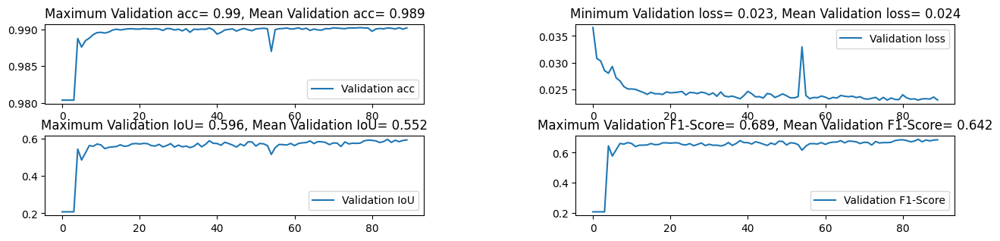

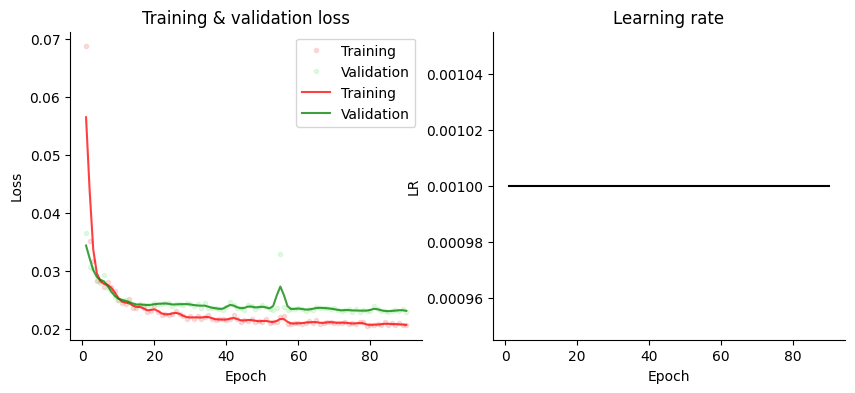

In [15]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [16]:
#Model
model = LinknetR50.apply(weights_reset)
#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)


Epoch 0: Train Loss=0.10362, validation Loss=0.04032 - Accs=[0.986, 0.413, 0.513]
Epoch 1: Train Loss=0.03260, validation Loss=0.02916 - Accs=[0.988, 0.459, 0.566]
Epoch 2: Train Loss=0.02796, validation Loss=0.02664 - Accs=[0.989, 0.519, 0.622]
Epoch 3: Train Loss=0.02645, validation Loss=0.02548 - Accs=[0.99, 0.546, 0.644]
Epoch 4: Train Loss=0.02647, validation Loss=0.02514 - Accs=[0.99, 0.522, 0.62]
Epoch 5: Train Loss=0.02584, validation Loss=0.02597 - Accs=[0.989, 0.529, 0.628]
Epoch 6: Train Loss=0.02545, validation Loss=0.02503 - Accs=[0.99, 0.523, 0.619]
Epoch 7: Train Loss=0.02448, validation Loss=0.02565 - Accs=[0.989, 0.537, 0.636]
Epoch 8: Train Loss=0.02420, validation Loss=0.02487 - Accs=[0.99, 0.537, 0.633]
Epoch 9: Train Loss=0.02394, validation Loss=0.02482 - Accs=[0.99, 0.542, 0.64]
Epoch 10: Train Loss=0.02346, validation Loss=0.02479 - Accs=[0.99, 0.566, 0.661]
Epoch 11: Train Loss=0.02369, validation Loss=0.02477 - Accs=[0.99, 0.53, 0.627]
Epoch 12: Train Loss=0.0

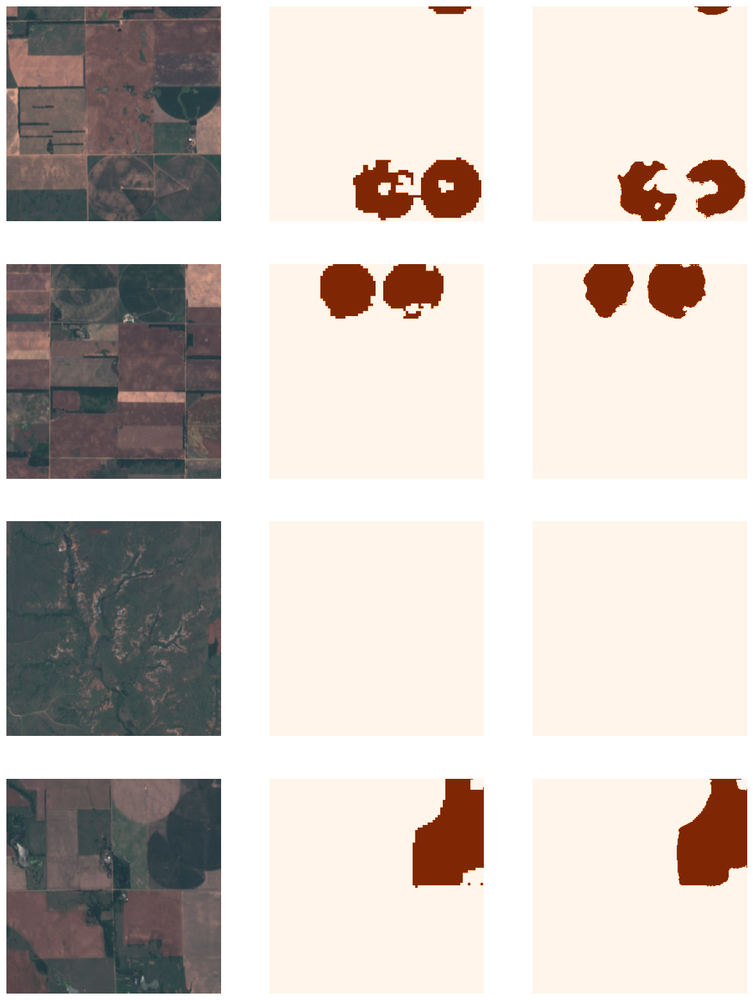

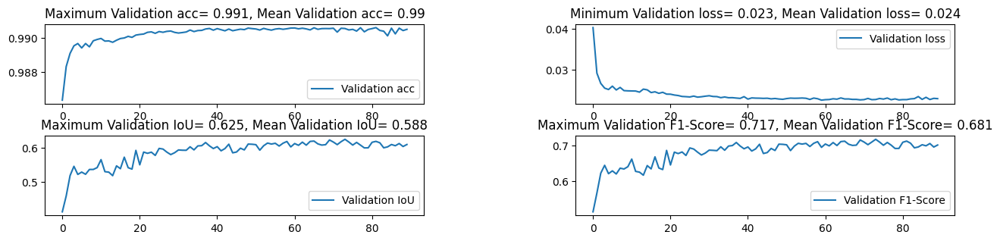

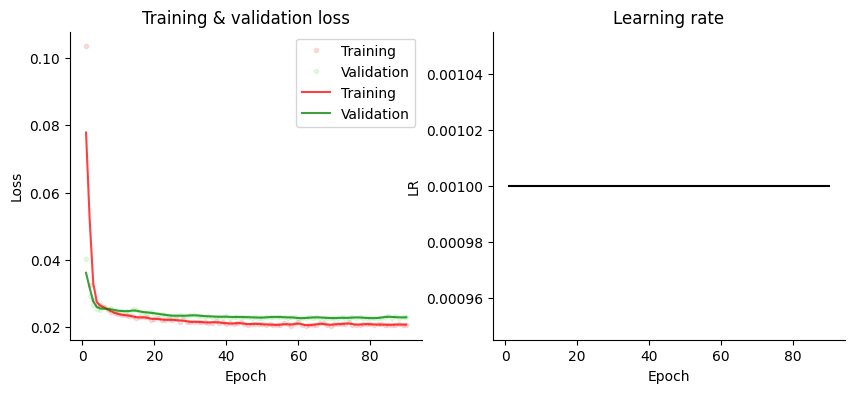

In [17]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [18]:
#Model
model = FPNR50.apply(weights_reset)
#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)

Epoch 0: Train Loss=0.06762, validation Loss=0.04736 - Accs=[0.981, 0.234, 0.268]
Epoch 1: Train Loss=0.04168, validation Loss=0.04911 - Accs=[0.981, 0.23, 0.278]
Epoch 2: Train Loss=0.03702, validation Loss=0.02900 - Accs=[0.987, 0.516, 0.615]
Epoch 3: Train Loss=0.02890, validation Loss=0.02903 - Accs=[0.988, 0.5, 0.595]
Epoch 4: Train Loss=0.02718, validation Loss=0.02917 - Accs=[0.988, 0.452, 0.528]
Epoch 5: Train Loss=0.02723, validation Loss=0.02586 - Accs=[0.989, 0.5, 0.582]
Epoch 6: Train Loss=0.02624, validation Loss=0.02602 - Accs=[0.989, 0.546, 0.638]
Epoch 7: Train Loss=0.02459, validation Loss=0.02404 - Accs=[0.99, 0.582, 0.673]
Epoch 8: Train Loss=0.02382, validation Loss=0.02571 - Accs=[0.989, 0.515, 0.599]
Epoch 9: Train Loss=0.02486, validation Loss=0.02895 - Accs=[0.988, 0.465, 0.542]
Epoch 10: Train Loss=0.02437, validation Loss=0.02406 - Accs=[0.99, 0.568, 0.655]
Epoch 11: Train Loss=0.02335, validation Loss=0.02458 - Accs=[0.99, 0.553, 0.637]
Epoch 12: Train Loss=0

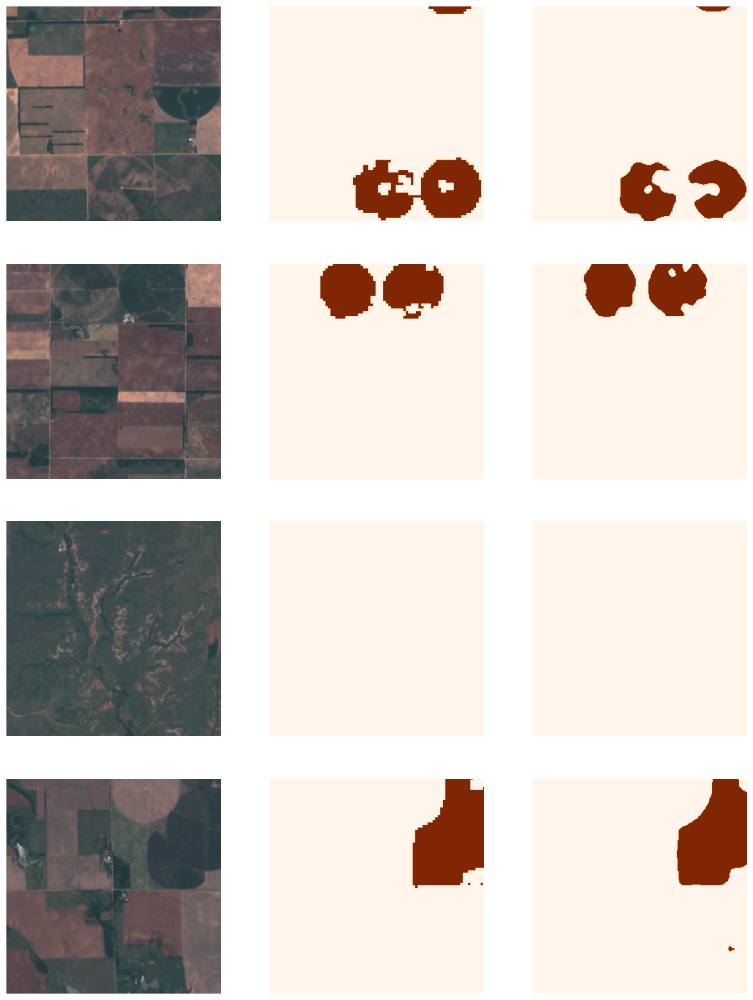

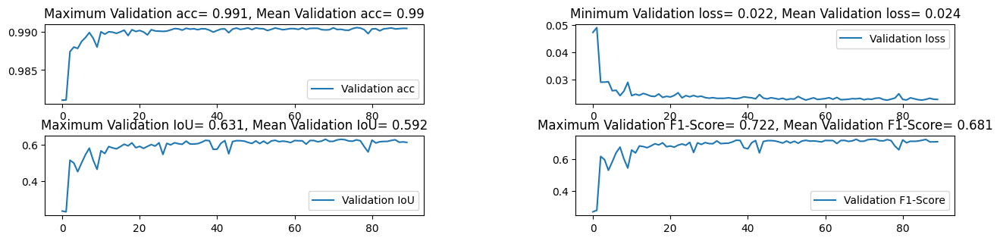

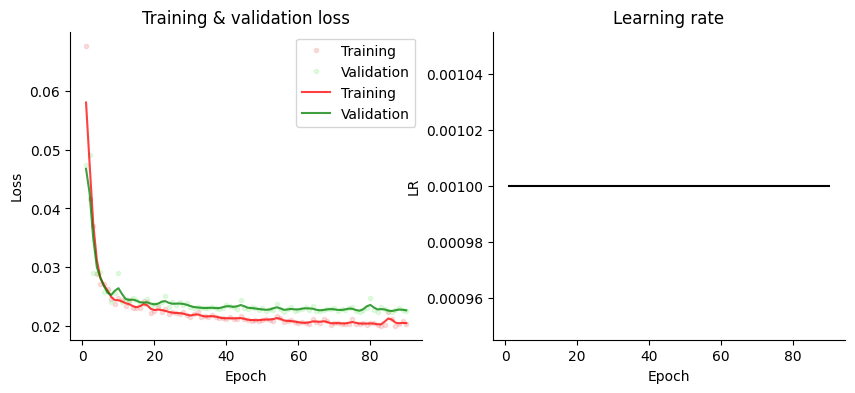

In [19]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [20]:
#Model
model = PSPNetR50.apply(weights_reset)
#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)




Epoch 0: Train Loss=0.08342, validation Loss=0.05990 - Accs=[0.98, 0.173, 0.179]
Epoch 1: Train Loss=0.05380, validation Loss=0.04964 - Accs=[0.981, 0.238, 0.286]
Epoch 2: Train Loss=0.04694, validation Loss=0.05438 - Accs=[0.981, 0.129, 0.163]
Epoch 3: Train Loss=0.04123, validation Loss=0.04019 - Accs=[0.984, 0.355, 0.437]
Epoch 4: Train Loss=0.04511, validation Loss=0.04153 - Accs=[0.983, 0.351, 0.439]
Epoch 5: Train Loss=0.03799, validation Loss=0.03634 - Accs=[0.985, 0.364, 0.451]
Epoch 6: Train Loss=0.04610, validation Loss=0.04521 - Accs=[0.982, 0.296, 0.366]
Epoch 7: Train Loss=0.03903, validation Loss=0.03697 - Accs=[0.984, 0.337, 0.408]
Epoch 8: Train Loss=0.03499, validation Loss=0.03496 - Accs=[0.985, 0.385, 0.474]
Epoch 9: Train Loss=0.03400, validation Loss=0.03463 - Accs=[0.985, 0.39, 0.476]
Epoch 10: Train Loss=0.03187, validation Loss=0.03522 - Accs=[0.985, 0.369, 0.454]
Epoch 11: Train Loss=0.03174, validation Loss=0.03403 - Accs=[0.985, 0.388, 0.474]
Epoch 12: Train 

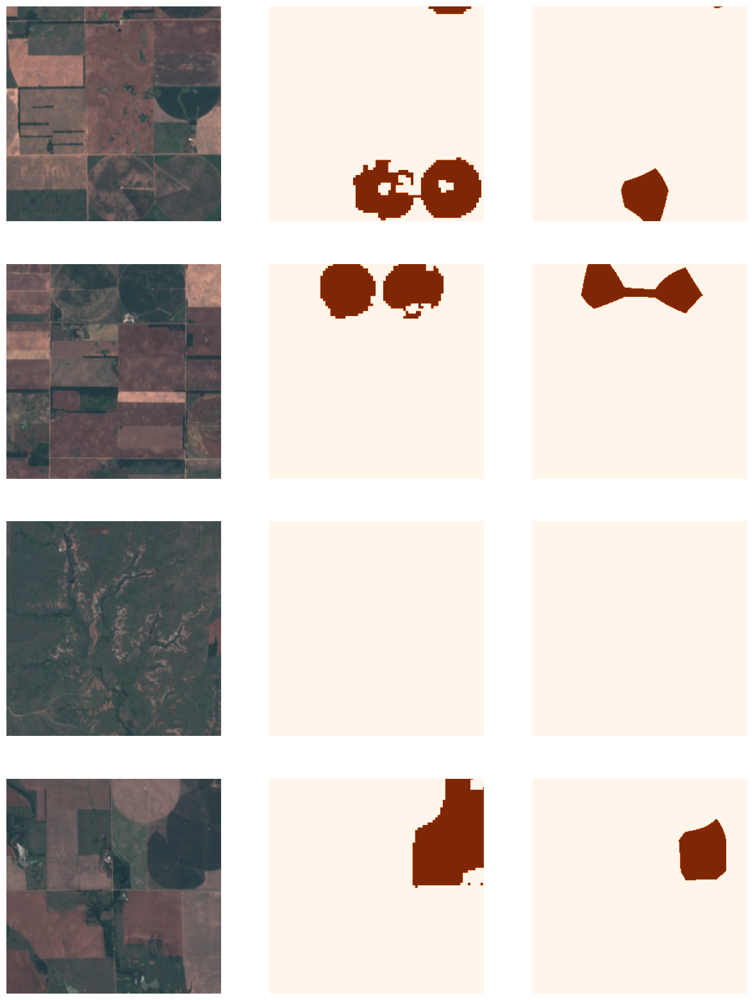

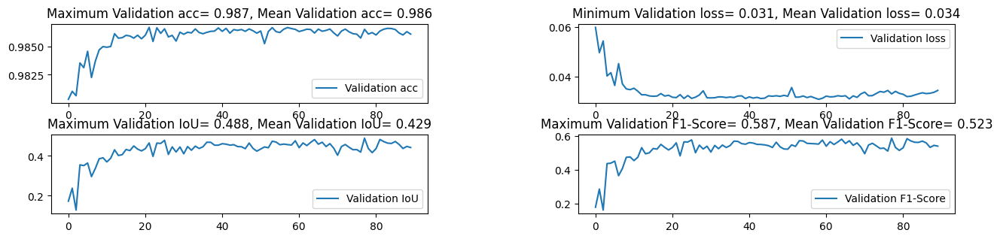

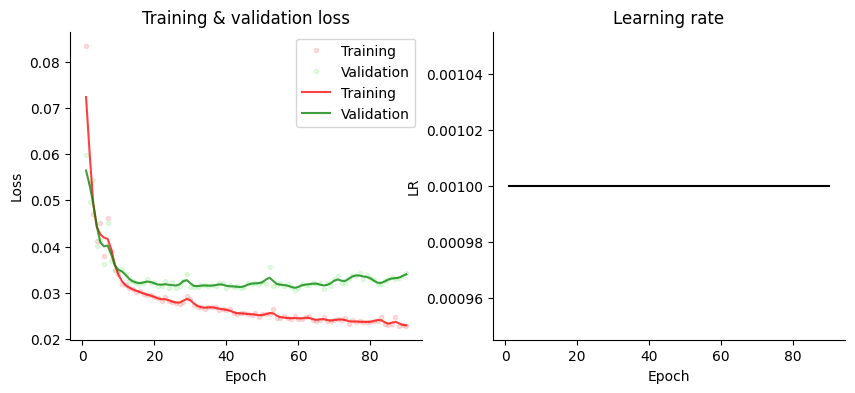

In [21]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [22]:
#Model
model = PANR50.apply(weights_reset)
#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)



Epoch 0: Train Loss=0.05118, validation Loss=0.03041 - Accs=[0.988, 0.476, 0.577]
Epoch 1: Train Loss=0.03561, validation Loss=0.05957 - Accs=[0.981, 0.228, 0.257]
Epoch 2: Train Loss=0.03619, validation Loss=0.02914 - Accs=[0.988, 0.525, 0.624]
Epoch 3: Train Loss=0.03060, validation Loss=0.04261 - Accs=[0.983, 0.342, 0.405]
Epoch 4: Train Loss=0.03394, validation Loss=0.02986 - Accs=[0.987, 0.488, 0.583]
Epoch 5: Train Loss=0.02988, validation Loss=0.02837 - Accs=[0.988, 0.503, 0.597]
Epoch 6: Train Loss=0.03289, validation Loss=0.02787 - Accs=[0.989, 0.532, 0.628]
Epoch 7: Train Loss=0.02703, validation Loss=0.02795 - Accs=[0.988, 0.486, 0.57]
Epoch 8: Train Loss=0.02535, validation Loss=0.02525 - Accs=[0.989, 0.541, 0.633]
Epoch 9: Train Loss=0.02524, validation Loss=0.02655 - Accs=[0.99, 0.567, 0.663]
Epoch 10: Train Loss=0.02541, validation Loss=0.02667 - Accs=[0.988, 0.521, 0.614]
Epoch 11: Train Loss=0.02637, validation Loss=0.02646 - Accs=[0.989, 0.552, 0.65]
Epoch 12: Train L

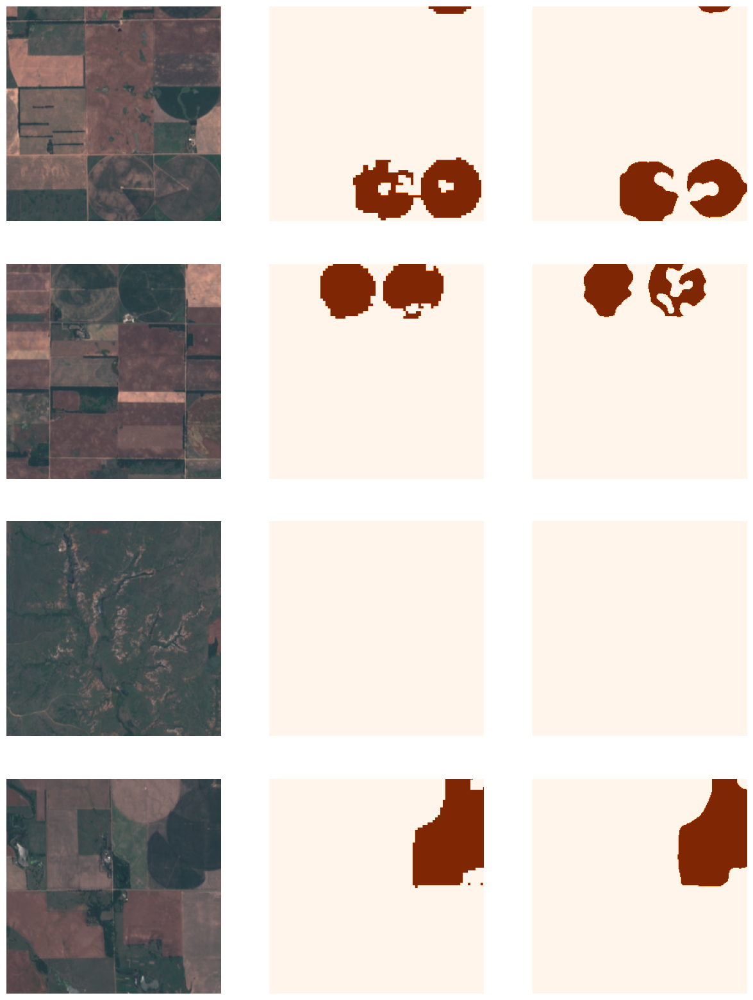

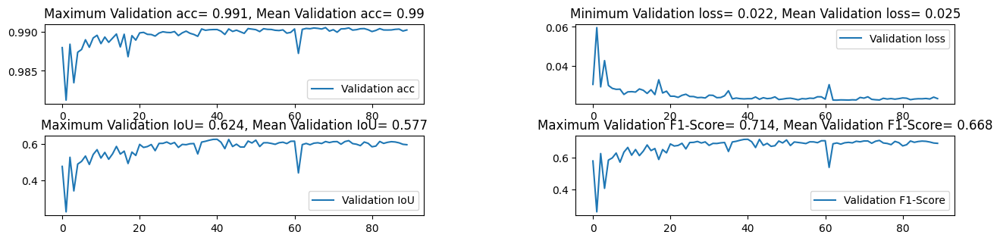

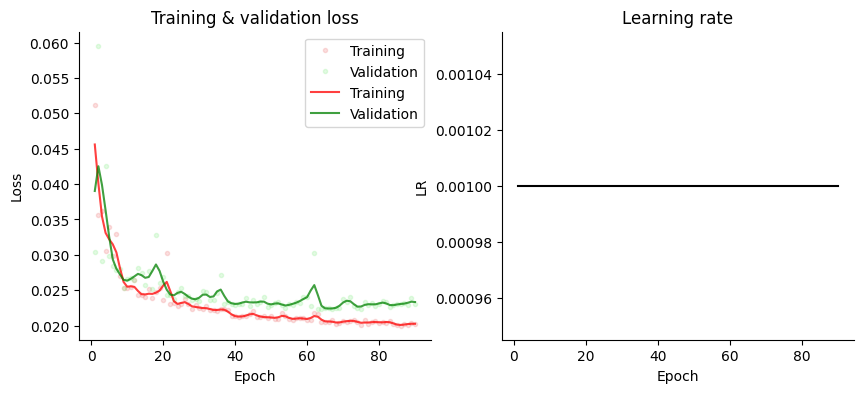

In [23]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)

In [24]:
#Model
model = unet.apply(weights_reset)
#Training and Evaluation
#size=24, length=2500, batchs=4, bands=2,3,4,5,6,7,8,11,12
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

from trainUnet import train_loop
hist=train_loop(epoches, train_dataloader, valid_dataloader, model, loss, optimizer, 
           acc_fns=[oa, iou,f1s], batch_tfms=None,devices=devices)


Epoch 0: Train Loss=0.25536, validation Loss=0.05218 - Accs=[0.985, 0.349, 0.435]
Epoch 1: Train Loss=0.03781, validation Loss=0.03243 - Accs=[0.988, 0.431, 0.535]
Epoch 2: Train Loss=0.02930, validation Loss=0.02926 - Accs=[0.989, 0.476, 0.576]
Epoch 3: Train Loss=0.02700, validation Loss=0.02712 - Accs=[0.989, 0.474, 0.569]
Epoch 4: Train Loss=0.02525, validation Loss=0.02519 - Accs=[0.989, 0.543, 0.638]
Epoch 5: Train Loss=0.02491, validation Loss=0.02626 - Accs=[0.988, 0.483, 0.57]
Epoch 6: Train Loss=0.02472, validation Loss=0.02521 - Accs=[0.99, 0.542, 0.638]
Epoch 7: Train Loss=0.02419, validation Loss=0.02536 - Accs=[0.99, 0.552, 0.646]
Epoch 8: Train Loss=0.02678, validation Loss=0.02536 - Accs=[0.99, 0.553, 0.648]
Epoch 9: Train Loss=0.02393, validation Loss=0.02456 - Accs=[0.99, 0.576, 0.67]
Epoch 10: Train Loss=0.02390, validation Loss=0.02499 - Accs=[0.99, 0.573, 0.665]
Epoch 11: Train Loss=0.02346, validation Loss=0.02515 - Accs=[0.99, 0.563, 0.656]
Epoch 12: Train Loss=0

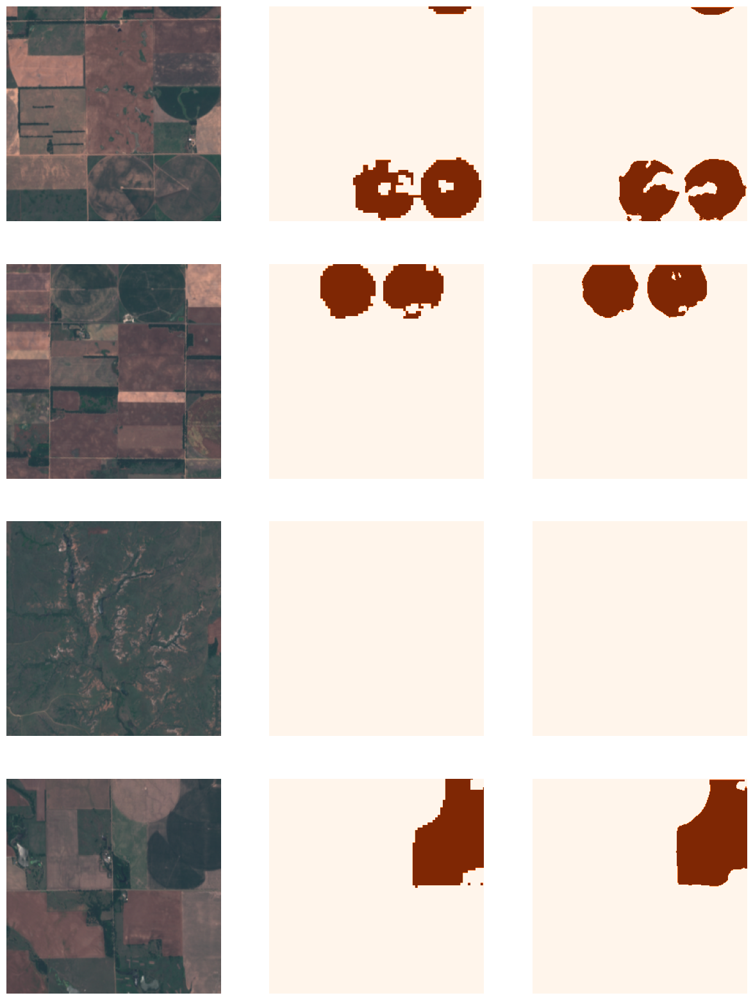

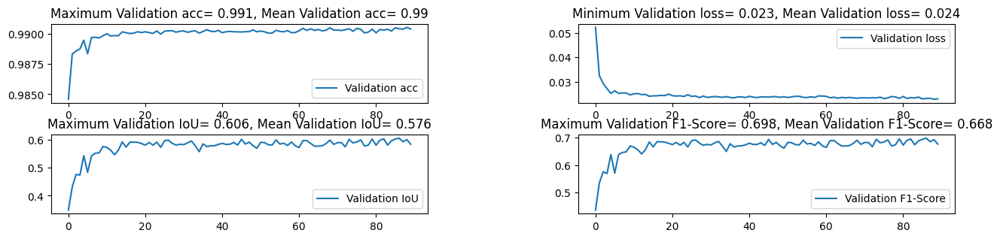

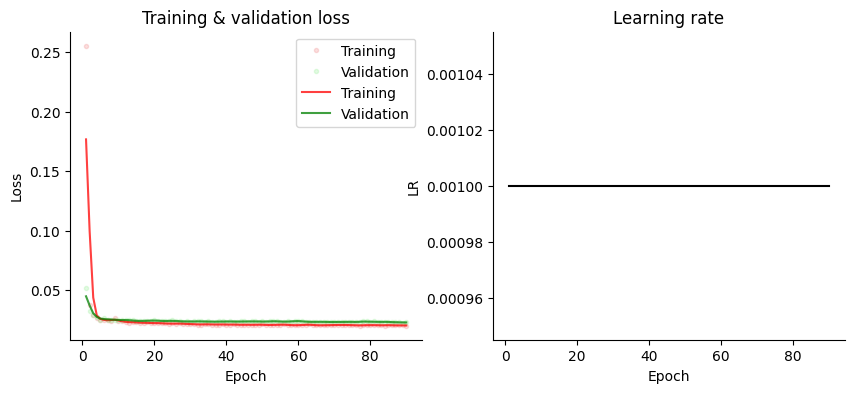

In [25]:
# Plot results
device=devices
cuda_model = model.cuda(device=device)
X = valid_batch['image'].cuda(device=device)

with torch.no_grad():
    pred = cuda_model(X)

normalized_masks = torch.nn.functional.softmax(pred, dim=1).cpu()
valid_batch['pred']=normalized_masks.argmax(1)
plot_compare(valid_batch,chnls=[2,1,0])

plot_results(hist)

fig = plot_training(
    hist['train_loss'],
    hist['val_loss'],
    .001*torch.ones(len(hist['train_loss'])),
    gaussian=True,
    sigma=1,
    figsize=(10, 4),
)